In [1]:
from flonacomldft.utils.io_utils import load_pickle_file, get_project_path
import numpy as np
import matplotlib.pyplot as plt

/mnt/home/amolina/miniconda3/envs/ml-dft/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def load_dic(isomer, ID, i, deep_type):
    if isomer==0:
        name='planar'
    elif isomer==1:
        name='3d'

    dic = load_pickle_file('training/'+name+'/'+str(deep_type)+'s/results/is'+str(isomer)+'_'+str(deep_type)+'_dic_training_'+str(ID)+'_'+str(i)+'.pkl', 
                            path=get_project_path())
    
    return dic

In [3]:
def plot_losses(model_dic, init = 5000, split=100, ax=None, n_blocks=True, log_scale=False):
    
    loss_train, loss_test = model_dic['losses']
    window_train = np.lib.stride_tricks.sliding_window_view(loss_train[init:], split)
    window_test = np.lib.stride_tricks.sliding_window_view(loss_test[init:], split)

    if ax==None:
        fig, ax = plt.subplots(1, 1)
    ax.plot(init+np.arange(len(loss_test[init:])), loss_train[init:], label = 'train')
    ax.plot(init+np.arange(len(loss_test[init:])), loss_test[init:], label = 'test')
    ax.plot(init+np.arange(window_train.mean(-1).shape[0]), window_train.mean(-1), label='average train window {:d}'.format(split))
    ax.plot(init+np.arange(window_test.mean(-1).shape[0]), window_test.mean(-1), label='average test window {:d}'.format(split))
    ax.plot(np.linspace(0, len(loss_train), 10), np.ones(10)*8/9*min(loss_test), 'o', label='models saved')
    if log_scale:
        ax.set_yscale('log')
    ax.legend()
    ax.set_ylabel('loss')
    ax.set_xlabel('number iterations')
    if n_blocks:
        ax.set_title('mode label: {:d}, n blocks:{:d}, hidden dim: {:d}, hidden depth: {:d}'.format(model_dic['args']['mode_label'], model_dic['args']['n_blocks'], model_dic['args']['hidden_dim'], model_dic['args']['hidden_depth']));
    else:
        ax.set_title('mode label: {:d}, hidden dim: {:d}, hidden depth: {:d}'.format(model_dic['args']['mode_label'], model_dic['args']['hidden_dim'], model_dic['args']['hidden_depth']));

    return ax

In [4]:
def plot_ratios(model_dic, init = 0, split=100, ax=None):
    
    ratio = model_dic['ratios']
    window_ratio = np.lib.stride_tricks.sliding_window_view(ratio[init:], split)

    if ax==None:
        fig, ax = plt.subplots(1, 1)
    ax.plot(init+np.arange(len(ratio[init:])), ratio[init:], label = 'ratio')
    ax.plot(init+np.arange(window_ratio.mean(-1).shape[0]), window_ratio.mean(-1), label='average ratio window {:d}'.format(split))
    ax.plot(np.linspace(0, len(ratio), 10), np.ones(10)*8/9*min(ratio), 'o', label='models saved')
    #ax.set_yscale('log')
    ax.legend()
    ax.set_ylabel('ratios')
    ax.set_xlabel('number iterations')
    #ax.set_title('mode label: {:d}, n blocks:{:d}, hidden dim: {:d}, hidden depth: {:d}'.format(model_dic['args']['mode_label'], model_dic['args']['n_blocks'], model_dic['args']['hidden_dim'], model_dic['args']['hidden_depth']));
    
    return ax

In [6]:
# ========================= TUNING Flows =========================

In [7]:
ids_flow_0 = np.append(2162929 + np.arange(0, 6), 2162937 + np.arange(0, 10))
ids_flow_1 = 2163111 + np.arange(0, 16)

ids_flow_0, ids_flow_1

(array([2162929, 2162930, 2162931, 2162932, 2162933, 2162934, 2162937,
        2162938, 2162939, 2162940, 2162941, 2162942, 2162943, 2162944,
        2162945, 2162946]),
 array([2163111, 2163112, 2163113, 2163114, 2163115, 2163116, 2163117,
        2163118, 2163119, 2163120, 2163121, 2163122, 2163123, 2163124,
        2163125, 2163126]))

In [8]:
start=0; end=15+1; step=1
#list(range(start, end, step))

In [9]:
flows_0 = [np.array([load_dic(0, id_flow_0, i, 'flow') for i in range(start, end, step)]) for id_flow_0 in ids_flow_0]

In [10]:
len(flows_0)*len(flows_0[0])

256

In [11]:
256

256

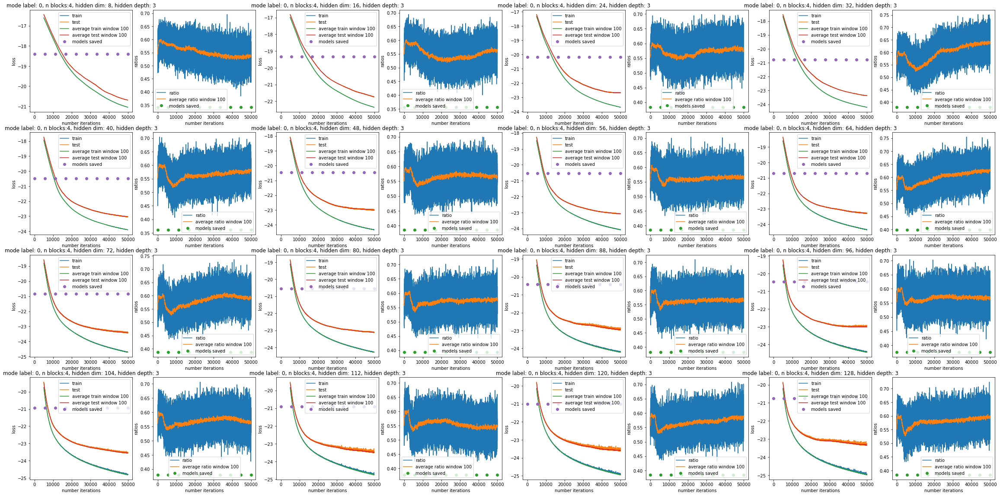

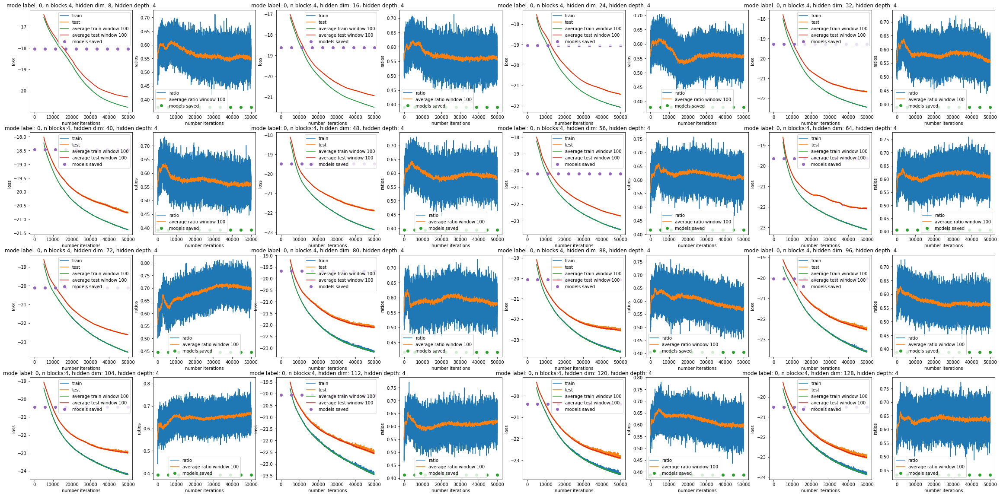

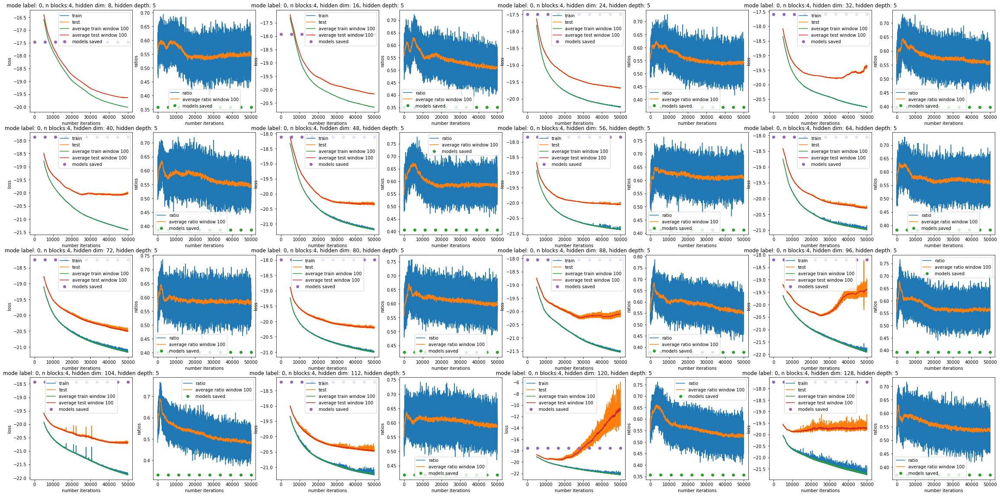

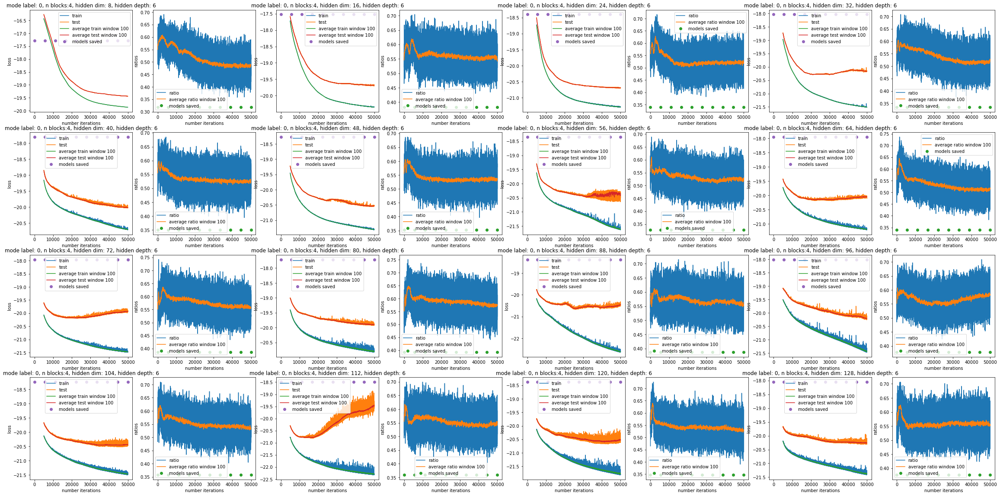

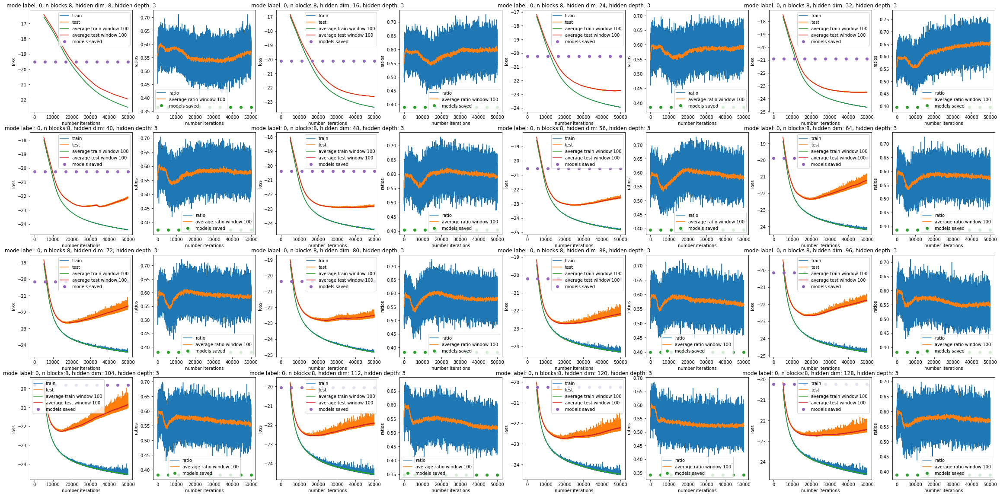

...

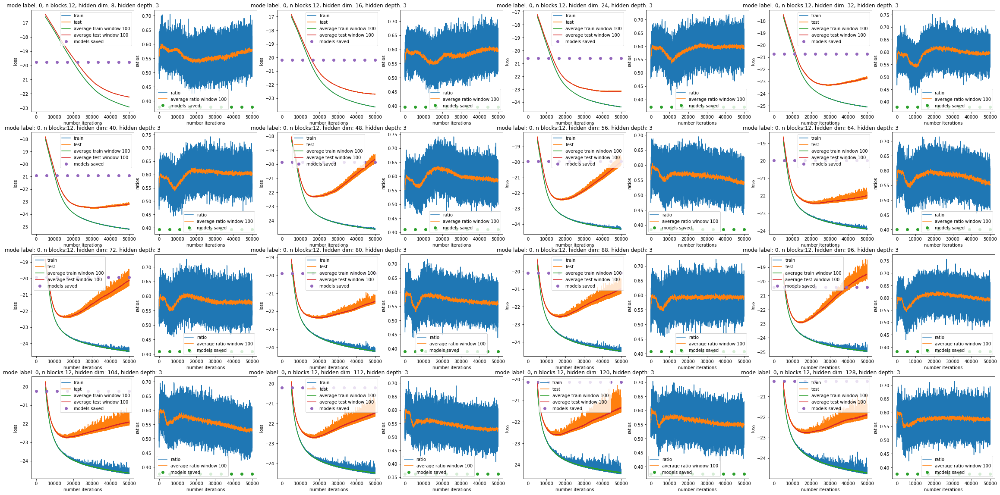

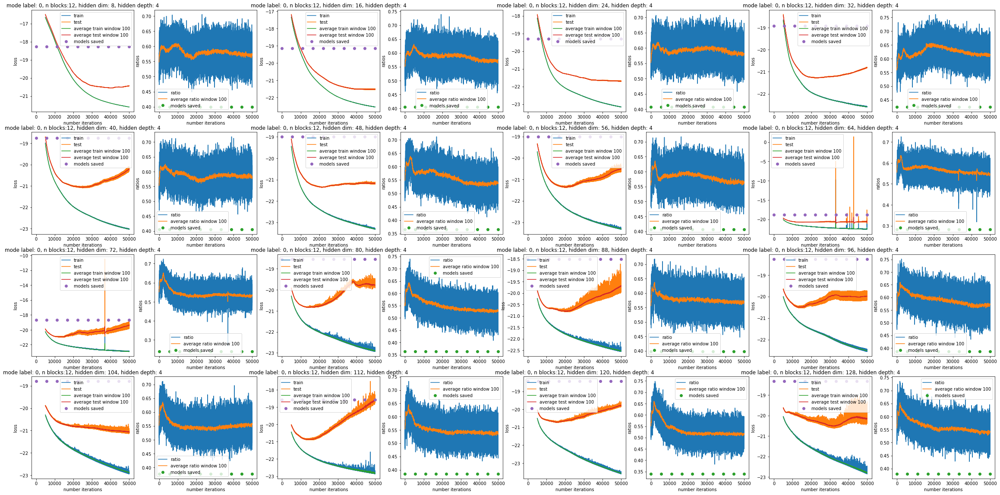

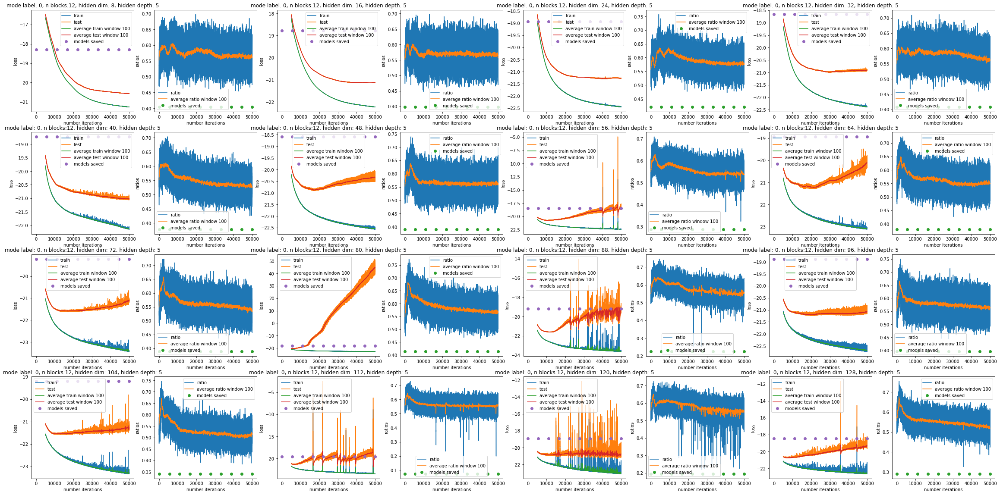

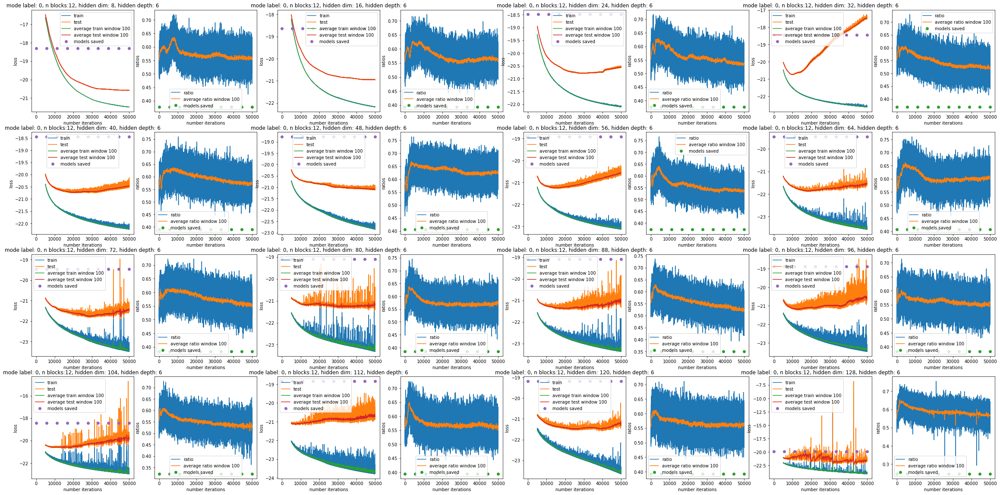

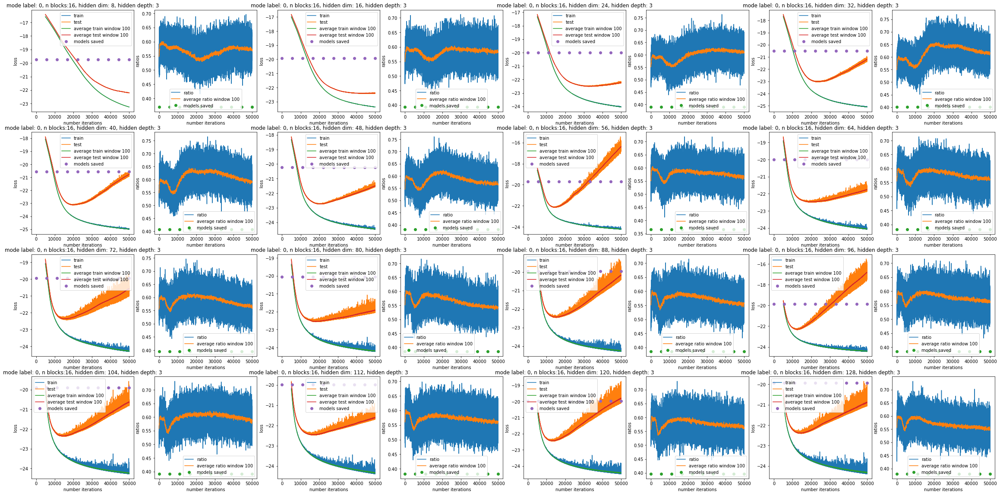

In [ ]:
for flow_0 in flows_0:
    cols = int(len(flow_0)/4)
    fig, axs = plt.subplots(cols, 8, figsize=(40, 20))
    k = 0
    j = 0
    for i in range(cols):
        for j in range(0, 8, 2):
            plot_losses(flow_0[k], ax=axs[i][j])
            plot_ratios(flow_0[k], ax=axs[i][j+1])
            k+=1
    plt.savefig('ml_{:d}_n_blocks_{:d}_n_hdp_{:d}'.format(flow_0[0]['args']['mode_label'], flow_0[0]['args']['n_blocks'], flow_0[0]['args']['hidden_depth']))
    plt.show(block=False)

In [9]:
flows_1 = [np.array([load_dic(1, id_flow_1, i, 'flow') for i in range(start, end, step)]) for id_flow_1 in ids_flow_1]

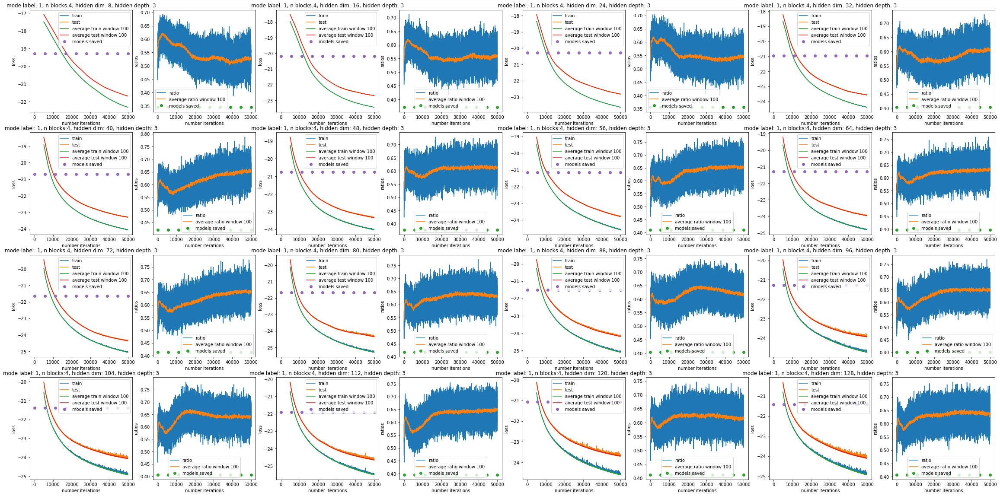

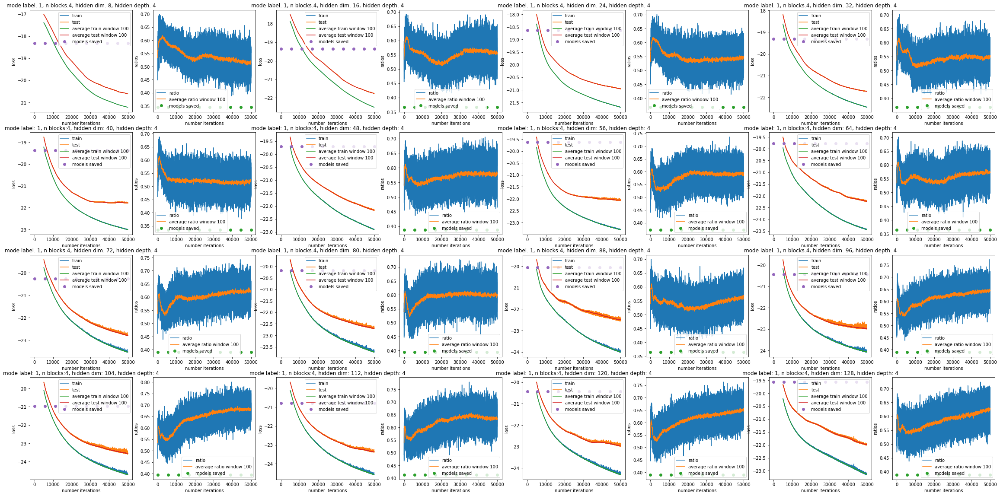

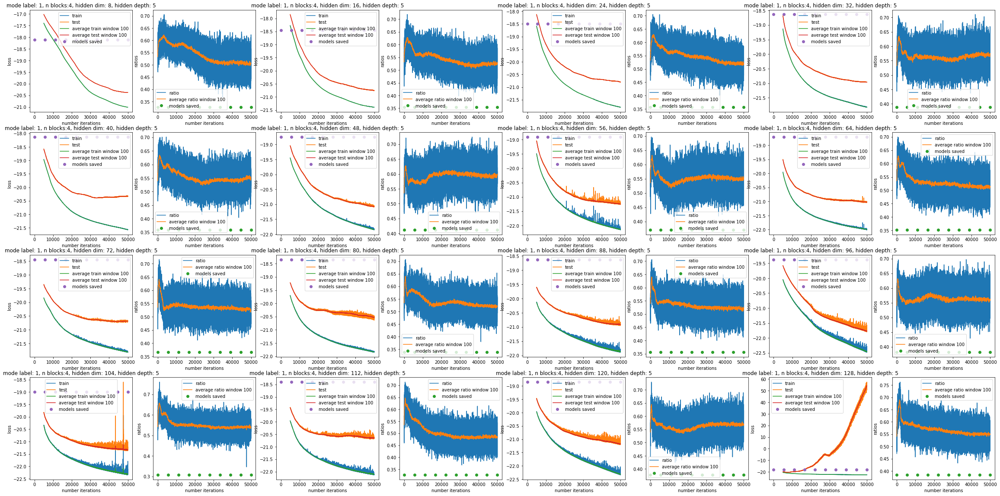

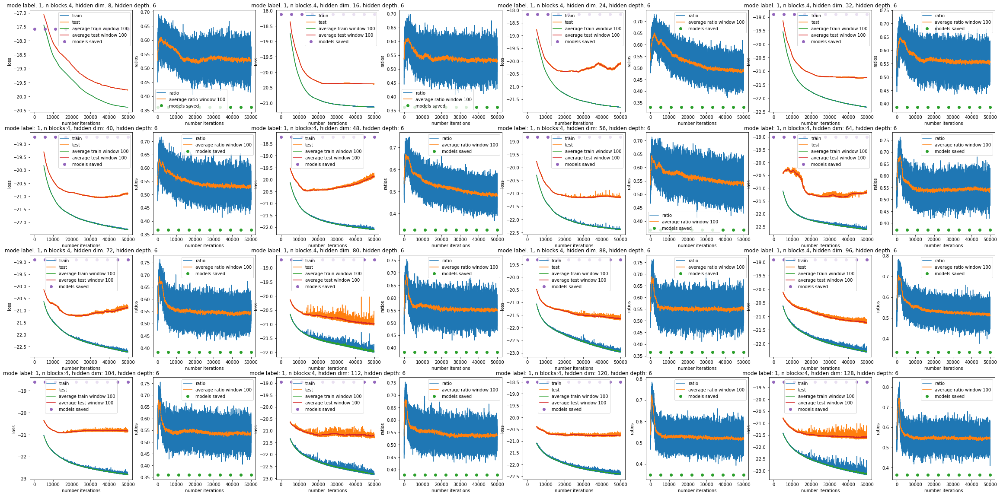

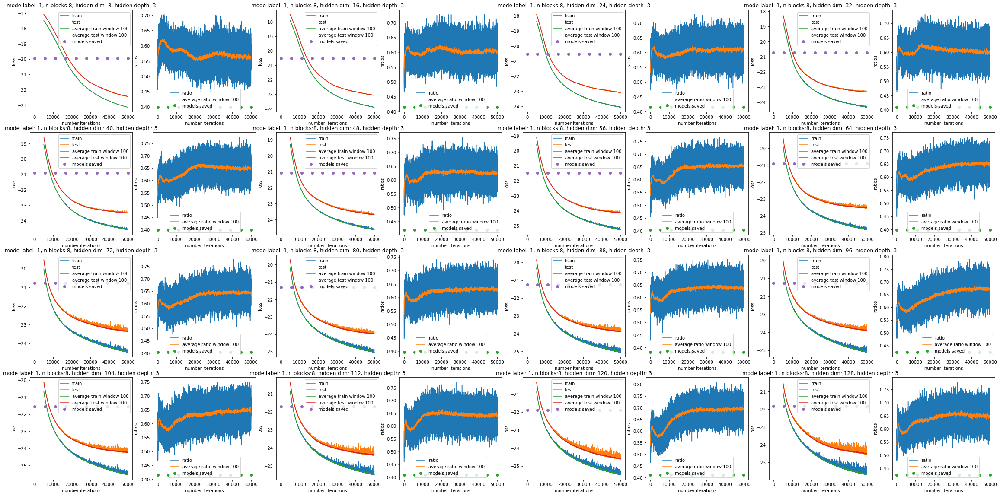

...

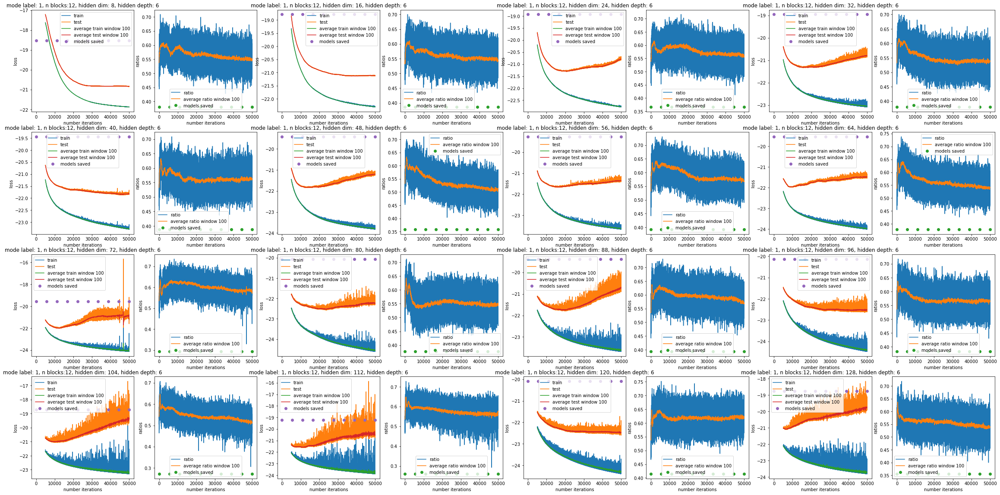

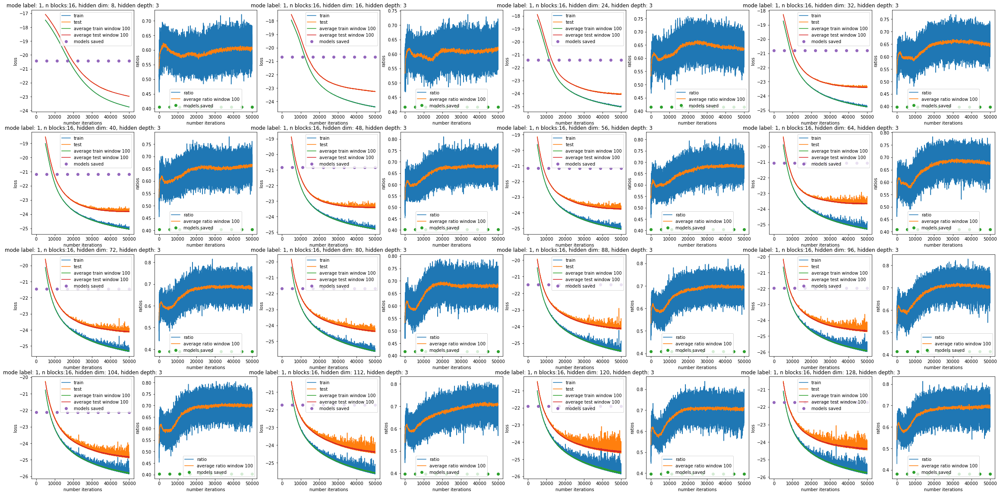

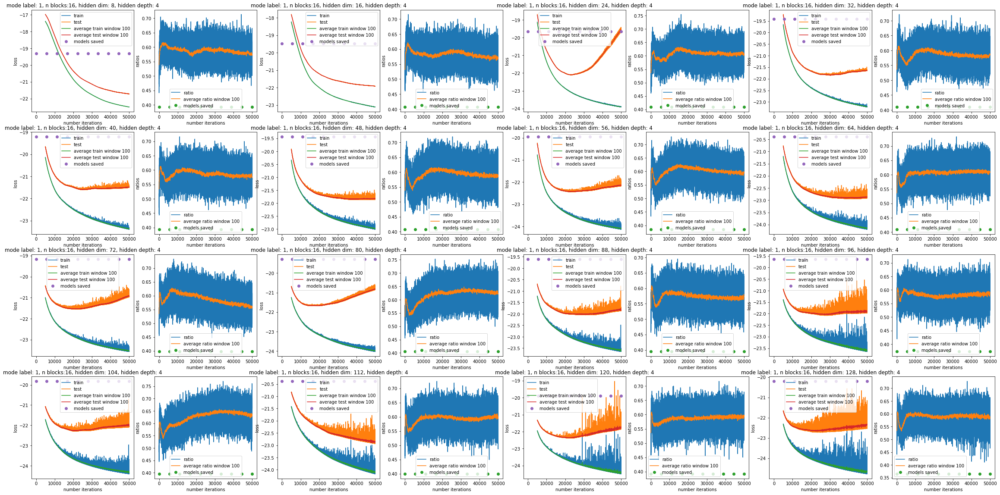

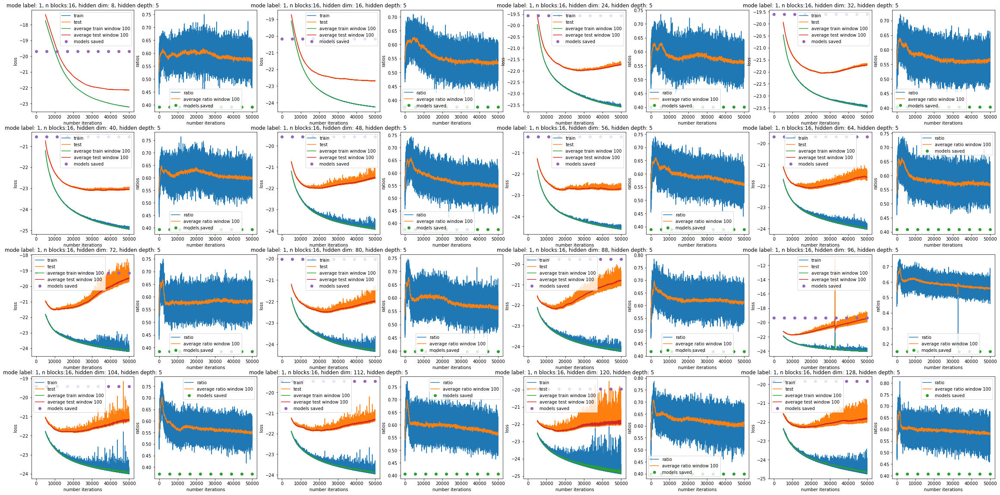

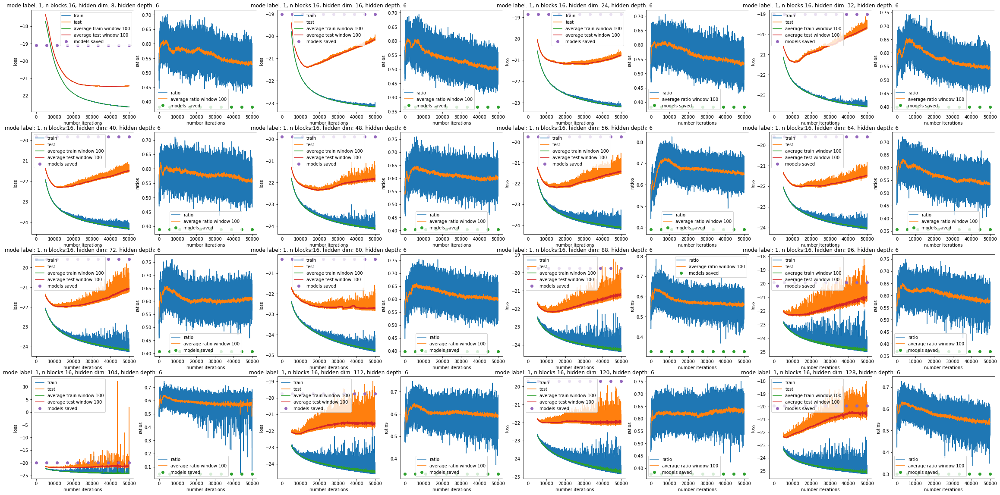

In [10]:
for flow_1 in flows_1:
    cols = int(len(flow_1)/4)
    fig, axs = plt.subplots(cols, 8, figsize=(40, 20))
    k = 0
    j = 0
    for i in range(cols):
        for j in range(0, 8, 2):
            plot_losses(flow_1[k], ax=axs[i][j])
            plot_ratios(flow_1[k], ax=axs[i][j+1])
            k+=1
    plt.savefig('ml_{:d}_n_blocks_{:d}_n_hdp_{:d}'.format(flow_1[0]['args']['mode_label'], flow_1[0]['args']['n_blocks'], flow_1[0]['args']['hidden_depth']))
    plt.show(block=False)

In [11]:
# ========================= TUNING MLPs =========================

In [7]:
start=0; end=15+1; step=3
#list(range(start, end, step))

In [8]:
n_hdp = 5
ids_mlp_0 = 2162993 + np.arange(0, n_hdp)
ids_mlp_1 = 2148015 + np.arange(0, n_hdp)

In [9]:
mlps_0 = [[load_dic(0, id_mlp_0, i, 'mlp') for i in range(start, end, step)] for id_mlp_0 in ids_mlp_0]
mlps_1 = [[load_dic(1, id_mlp_1, i, 'mlp') for i in range(start, end, step)] for id_mlp_1 in ids_mlp_1]

In [10]:
#def convergence(arr, delta, compare_step):
#    for i in range(1, len(arr)-compare_step):
#        if abs(arr[i-1]-arr[i]) <= delta and abs(arr[i-1]-arr[i+compare_step]) <= delta:
#            value, steps_needed = arr[i], i
#            return value, steps_needed

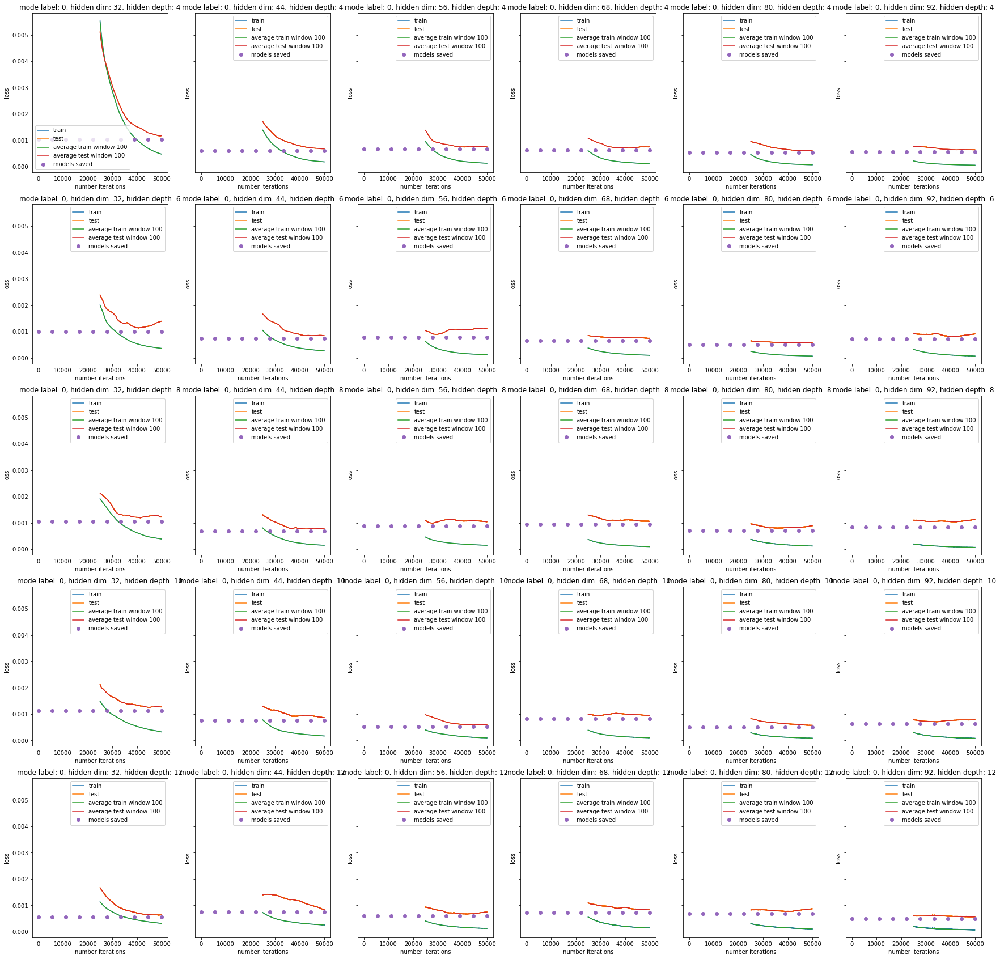

In [11]:
fig, axs = plt.subplots(len(mlps_0), len(mlps_0[0]), figsize=(30, 30), sharey=True)
for i in range(len(mlps_0)):
    for j in range(len(mlps_0[i])):
        plot_losses(mlps_0[i][j], init=25000, ax=axs[i][j], n_blocks=False, log_scale=True)

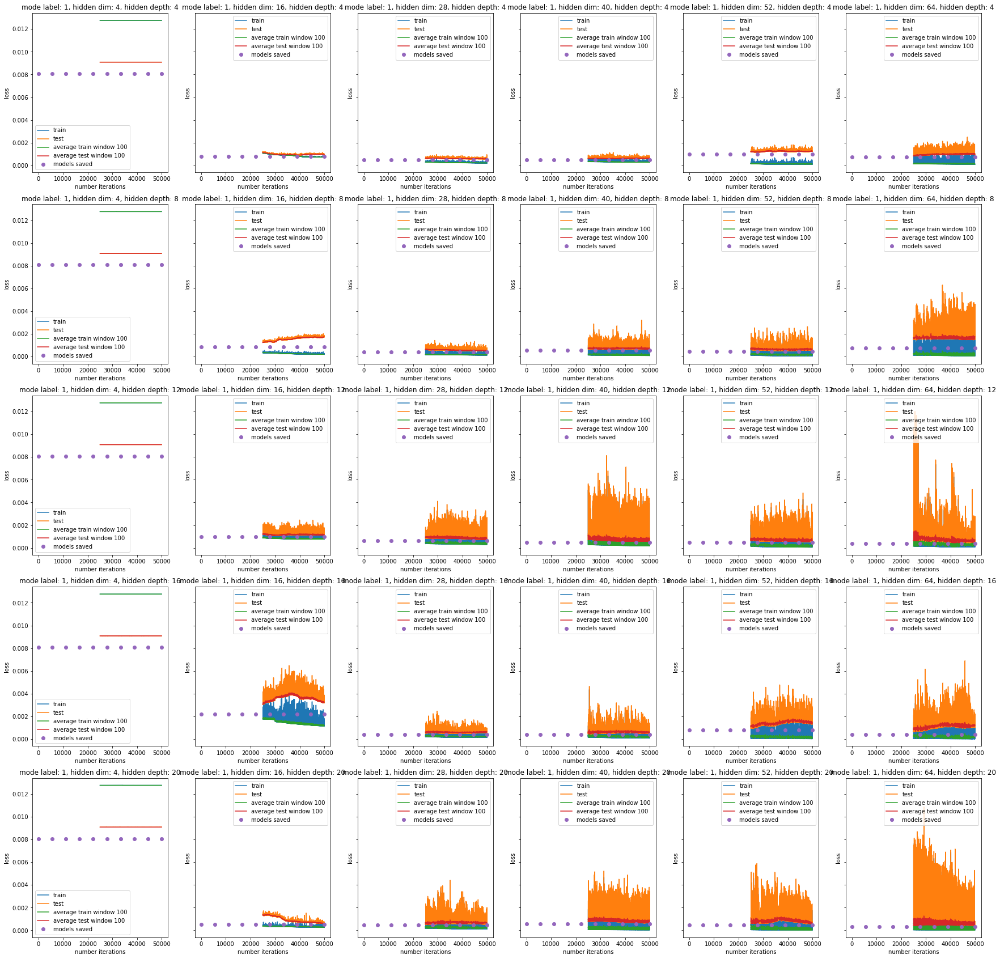

In [15]:
fig, axs = plt.subplots(len(mlps_1), len(mlps_1[0]), figsize=(30, 30), sharey=True)
for i in range(len(mlps_1)):
    for j in range(len(mlps_1[i])):
        plot_losses(mlps_1[i][j], init=25000, ax=axs[i][j], n_blocks=False, log_scale=True)

In [17]:
mlps_1[0][0]['args']

{'num_procs': 2,
 'n_iter': 50000,
 'learning_rate': 0.0005,
 'mode_label': 1,
 'hidden_dim': 4,
 'hidden_depth': 4,
 'slurm_id': '2148015_0',
 'date_start': '01:01:22 19-02-2023',
 'random_seed': '28',
 'date_end': '01:05:07 19-02-2023'}

In [18]:
mlps_0[0][0]['args']

{'num_procs': 4,
 'n_iter': 50000,
 'learning_rate': 1e-05,
 'mode_label': 0,
 'hidden_dim': 32,
 'hidden_depth': 4,
 'slurm_id': '2162993_0',
 'date_start': '17:43:57 25-02-2023',
 'random_seed': '67',
 'date_end': '17:49:45 25-02-2023'}